In [45]:
import os
import rasterio as rio
import numpy as np
import shapely
import pyproj
import geopandas as gpd
import matplotlib.pyplot as plt
import rioxarray as riox
import rasterio as rio
import xarray as xr
import netCDF4
from osgeo import gdal
import pandas as pd
from datetime import datetime
import snowFun
import importlib
importlib.reload(snowFun)
import dask.array
import matplotlib as mpl
from matplotlib.colors import TwoSlopeNorm, LogNorm
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import sklearn
# %matplotlib widget

In [2]:
# define folder and file paths
folder_AGVA = os.path.join('C:',os.sep,'Users','lzell','OneDrive - Colostate','Desktop',"AGVA")
folder_dems = os.path.join(folder_AGVA, "DEMs", "time_varying_DEMs", "10m")
folder_class = os.path.join(folder_AGVA, 'classified images', 'S2_Classified_Cloudmasked_Merged')
folder_cloud = os.path.join(folder_AGVA, 'classified images', 'S2_Cloud_Merged')
folder_meta = os.path.join(folder_AGVA, "classified images", "meta csv", "S2")
folder_climate = os.path.join(folder_AGVA, "Climate")

# open rgi
path_rgi = os.path.join(folder_AGVA, 'RGI', "rgi_2km_o3regions", "rgi_2km_o3regions.shp")
rgi_gdf = gpd.read_file(path_rgi, include_fields=['RGIId', 'geometry'])

# open the big data csv
path_data = os.path.join(folder_AGVA, 'Derived products', 'S2', 'Final_Data_Table.csv')
data_df = pd.read_csv(path_data)

# open monthly climate csv
path_climate = os.path.join(folder_climate, 'RGI_Monthly_Averages.csv')
climate_df = pd.read_csv(path_climate)

# subset rgi to the glaciers we have data for
rgi_gdf = rgi_gdf[ rgi_gdf['RGIId'].isin(data_df['RGIId']) ]
# print(rgi_gdf.columns)

# merge columns
all_data_gdf = gpd.GeoDataFrame(pd.merge(data_df, rgi_gdf, on="RGIId"))

# replace -9999 with nan
all_data_gdf[all_data_gdf==-9999] = np.nan

### add climate as columns
all_data_gdf = gpd.GeoDataFrame(pd.merge(all_data_gdf, climate_df, on="RGIId"))

# what columns are available?
print(all_data_gdf.shape)
print(all_data_gdf.columns.values)

(3023, 245)
['RGIId' 'GLIMSId' 'BgnDate' 'EndDate' 'CenLon' 'CenLat' 'O1Region'
 'O2Region' 'Area' 'Zmin' 'Zmax' 'Zmed' 'Slope' 'Aspect' 'Lmax' 'Status'
 'Connect' 'Form' 'TermType' 'Surging' 'Linkages' 'Name' 'O3Region'
 'O3_name' 'ela_2018' 'ela_2019' 'ela_2020' 'ela_2021' 'ela_2022'
 'aar_2018' 'aar_2019' 'aar_2020' 'aar_2021' 'aar_2022' 'off_glacier_2018'
 'off_glacier_2019' 'off_glacier_2020' 'off_glacier_2021'
 'off_glacier_2022' 'date_2018' 'date_2019' 'date_2020' 'date_2021'
 'date_2022' 'ela_avg_product' 'aar_avg_product' 'off_glacier_avg_product'
 'percent_observed_average_product' 'dhdt_1520' 'dhdt_1020'
 'distance_from_ocean' 'hyps_ela' 'hyps_aar' 'hyps_aar_20' 'hyps_aar_40'
 'hyps_aar_60' 'hyps_aar_80' 'hyps_aar_100' 'hyps_aar_120' 'hyps_aar_140'
 'hyps_aar_160' 'hyps_aar_180' 'hyps_aar_200' 'geometry' 'z_era5land'
 '18_01_p' '18_01_t' '18_01_pdd' '18_02_p' '18_02_t' '18_02_pdd' '18_03_p'
 '18_03_t' '18_03_pdd' '18_04_p' '18_04_t' '18_04_pdd' '18_05_p' '18_05_t'
 '18_05_pd

# Calculate additional column data

### Average AAR, ELA, AA, and anomalies for each year

In [3]:
all_data_gdf['aa_avg_product'] = all_data_gdf['aar_avg_product']*all_data_gdf['Area']
all_data_gdf['aar_median'] = all_data_gdf[['aar_2018', 'aar_2019', 'aar_2020', 'aar_2021', 'aar_2022']].median(axis=1, skipna=True)
all_data_gdf['ela_median'] = all_data_gdf[['ela_2018', 'ela_2019', 'ela_2020', 'ela_2021', 'ela_2022']].median(axis=1, skipna=True)
all_data_gdf['aa_median'] = all_data_gdf['aar_median']*all_data_gdf['Area']

for y in [2018,2019,2020,2021,2022]:
    all_data_gdf[f'aa_{y}'] = all_data_gdf[f'aar_{y}']*all_data_gdf['Area']
    all_data_gdf[f'aar_{y}_relative'] = all_data_gdf[f'aar_{y}'] - all_data_gdf[f'aar_avg_product']
    all_data_gdf[f'ela_{y}_relative'] = all_data_gdf[f'ela_{y}'] - all_data_gdf[f'ela_avg_product']

# min and max ela, aar
all_data_gdf['aar_min'] = all_data_gdf[['aar_2018', 'aar_2019', 'aar_2020', 'aar_2021', 'aar_2022']].min(axis=1, skipna=True)
all_data_gdf['aar_max'] = all_data_gdf[['aar_2018', 'aar_2019', 'aar_2020', 'aar_2021', 'aar_2022']].max(axis=1, skipna=True)
all_data_gdf['ela_min'] = all_data_gdf[['ela_2018', 'ela_2019', 'ela_2020', 'ela_2021', 'ela_2022']].min(axis=1, skipna=True)
all_data_gdf['ela_max'] = all_data_gdf[['ela_2018', 'ela_2019', 'ela_2020', 'ela_2021', 'ela_2022']].max(axis=1, skipna=True)
all_data_gdf['aar_range']= all_data_gdf['aar_max'] - all_data_gdf['aar_min']
all_data_gdf['ela_range']= all_data_gdf['ela_max'] - all_data_gdf['ela_min']
all_data_gdf['ela_range_norm']= all_data_gdf['ela_range']/(all_data_gdf['Zmax']-all_data_gdf['Zmin'])

### Count number of years with ELA off-glacier, and years with essentially no AA

In [4]:
### count number of years with ela off-glacier
# first need to fix the column
for y in [2018,2019,2020,2021,2022]:
    all_data_gdf[f'off_glacier_{y}'].replace({"False":"0", "True":"1"}, inplace=True)
    all_data_gdf[f'off_glacier_{y}'] = all_data_gdf[f'off_glacier_{y}'].astype(int)
    all_data_gdf[f'off_glacier_{y}'].replace(-9999, np.nan, inplace=True)
all_data_gdf["off_glacier_nyears"] = all_data_gdf[['off_glacier_2018', 'off_glacier_2019', 'off_glacier_2020', 'off_glacier_2021', 'off_glacier_2022']].sum(axis=1, skipna=True)

### count number of years with aar<0.1
all_data_gdf["no_aar_nyears"] = (all_data_gdf[['aar_2018', 'aar_2019', 'aar_2020', 'aar_2021', 'aar_2022']]<0.1).sum(axis=1, skipna=True)


### Get the day of year of each observation, doy anomaly

In [5]:
for y in [2018,2019,2020,2021,2022]:
    all_data_gdf[f'doy_{y}'] = pd.to_datetime(all_data_gdf[f'date_{y}']).dt.dayofyear.replace(1, np.nan)

all_data_gdf['doy_median'] = all_data_gdf[['doy_2018', 'doy_2019', 'doy_2020', 'doy_2021', 'doy_2022']].median(axis=1, skipna=True)

for y in [2018,2019,2020,2021,2022]:
    all_data_gdf[f'doy_{y}_anom'] = all_data_gdf[f'doy_{y}'] - all_data_gdf['doy_median']

### Summer and winter temperature, precipitation averages and anomalies

In [6]:
### calculate some climate parameters here

# define winter and summer months
all_years = ['18','19','20','21','22']
months_summer = ['06','07','08','09']
months_winter = ['01','02','03','04']

columns_s = [f'{y}_{m}' for m in months_summer for y in all_years]
columns_w = [f'{y}_{m}' for m in months_winter for y in all_years]

# calculate average temp and precip for summer and winter
all_data_gdf['t_s_avg'] =  all_data_gdf[[f'{m}_t' for m in columns_s]].mean(axis=1, skipna=True)
all_data_gdf['t_w_avg'] =  all_data_gdf[[f'{m}_t' for m in columns_w]].mean(axis=1, skipna=True)
all_data_gdf['p_s_avg'] =  all_data_gdf[[f'{m}_p' for m in columns_s]].mean(axis=1, skipna=True)
all_data_gdf['p_w_avg'] =  all_data_gdf[[f'{m}_p' for m in columns_w]].mean(axis=1, skipna=True)

# calculate annual anomalies for each year/season
for y in all_years:
    
    # temperatures
    all_data_gdf[f't_s_{y}_anom'] = all_data_gdf[[f'{y}_{m}_t' for m in months_summer]].mean(axis=1, skipna=True) - all_data_gdf['t_s_avg']
    all_data_gdf[f't_w_{y}_anom'] = all_data_gdf[[f'{y}_{m}_t' for m in months_winter]].mean(axis=1, skipna=True) - all_data_gdf['t_w_avg']
    
    # precips
    all_data_gdf[f'p_s_{y}_anom'] = all_data_gdf[[f'{y}_{m}_p' for m in months_summer]].mean(axis=1, skipna=True) - all_data_gdf['p_s_avg']
    all_data_gdf[f'p_w_{y}_anom'] = all_data_gdf[[f'{y}_{m}_p' for m in months_winter]].mean(axis=1, skipna=True) - all_data_gdf['p_w_avg']

    

### Calculate positive degree days for each glacier each year (April to September).
PDDs are calculated for the median glacier elevation (from RGI), using temperature from ERA5-Land at the glacier center point, and assuming a -5.0 degrees C lapse rate

In [7]:
# calculate annual PDDs for each glacier (lets say april to september), anomaly from mean
months_pdd = ['04', '05', '06','07','08','09']

for y in all_years:
    all_data_gdf[f'pdd_{y}'] = all_data_gdf[[f'{y}_{m}_pdd' for m in months_pdd]].sum(axis=1, skipna=True)

all_data_gdf['pdd_avg'] = all_data_gdf[['pdd_18', 'pdd_19', 'pdd_20', 'pdd_21', 'pdd_22']].mean(axis=1, skipna=True)

for y in all_years:
    all_data_gdf[f'pdd_{y}_anom_diff'] = all_data_gdf[f'pdd_{y}'] - all_data_gdf['pdd_avg'] # calculate as difference
    all_data_gdf[f'pdd_{y}_anom_frac'] = all_data_gdf[f'pdd_{y}'] / all_data_gdf['pdd_avg'] # calculate as ratio

### Some examples of how to calculate region-wide values

In [8]:
# add column for the total glacier area in each O2Region
temp = all_data_gdf.groupby('O2Region')['Area'].sum().rename('O2Region_area')
all_data_gdf = gpd.GeoDataFrame(pd.merge(all_data_gdf, temp, on="O2Region"))

# add column for the total glacier area in each O3Region
temp = all_data_gdf.groupby('O3Region')['Area'].sum().rename('O3Region_area')
all_data_gdf = gpd.GeoDataFrame(pd.merge(all_data_gdf, temp, on="O3Region"))

### Load in O3Region climate anomalies

In [128]:
path_o3c = os.path.join(folder_climate, "O3Regions", f'O3Region_anomalies.csv')
df_o3c = pd.read_csv(path_o3c)

# lets make a whole new df for o3region stats

In [11]:
# start by getting the full geometry for each subregion. keep this stored in a separate gdf for later
O3_geom = all_data_gdf[['geometry', 'O3Region']].dissolve(by='O3Region').reset_index()

In [129]:
# create pandas df (no geometry)
# calculating total glacier number, glacier area, mean and median size, aa, and aar for each region
o3_df = pd.DataFrame(all_data_gdf.groupby('O3Region')['Area'].count().rename('number'))
o3_df['area'] = all_data_gdf.groupby('O3Region')['Area'].sum()
o3_df['area_mean'] = all_data_gdf.groupby('O3Region')['Area'].mean()
o3_df['area_median'] = all_data_gdf.groupby('O3Region')['Area'].median()
o3_df['aa'] = all_data_gdf.groupby('O3Region')['aa_avg_product'].sum()
o3_df['aar'] = o3_df['aa']/o3_df['area']

# calculate dhdt for each region
all_data_gdf['temporary'] = (all_data_gdf['Area']/all_data_gdf['O3Region_area']) * all_data_gdf['dhdt_1520']
o3_df['dhdt_1520'] = all_data_gdf.groupby('O3Region')['temporary'].sum()
all_data_gdf['temporary'] = (all_data_gdf['Area']/all_data_gdf['O3Region_area']) * all_data_gdf['dhdt_1020']
o3_df['dhdt_1020'] = all_data_gdf.groupby('O3Region')['temporary'].sum()

# calculate aar each year
for y in [2018,2019,2020,2021,2022]:
    o3_df[f'aa_{y}'] = all_data_gdf.groupby('O3Region')[f'aa_{y}'].sum()
    o3_df[f'aar_{y}'] = o3_df[f'aa_{y}']/o3_df['area']

# calculate average elas each year, for glaciers where ela was observed
for y in [2018,2019,2020,2021,2022]:
    
    # for this year, subset to valid ela obs
    temp = all_data_gdf[all_data_gdf[f'off_glacier_{y}']==0]
    o3_df[f'ela_mean_{y}'] = temp.groupby('O3Region')[f'ela_{y}'].mean()
    o3_df[f'ela_median_{y}'] = temp.groupby('O3Region')[f'ela_{y}'].median()
    
    # do the same, but only for larger glaciers (5km2 or bigger)
    temp = all_data_gdf[ (all_data_gdf[f'off_glacier_{y}']==0) & (all_data_gdf['Area']>=5) ]
    o3_df[f'ela_5km_mean_{y}'] = temp.groupby('O3Region')[f'ela_{y}'].mean()
    o3_df[f'ela_5km_median_{y}'] = temp.groupby('O3Region')[f'ela_{y}'].median()

# get 5-year average ela
o3_df[f'ela_mean'] = o3_df[['ela_mean_2018','ela_mean_2019','ela_mean_2020','ela_mean_2021','ela_mean_2022']].mean(axis=1)
o3_df[f'ela_median'] = o3_df[['ela_median_2018','ela_median_2019','ela_median_2020','ela_median_2021','ela_median_2022']].mean(axis=1)
o3_df[f'ela_5km_mean'] = o3_df[['ela_5km_mean_2018','ela_5km_mean_2019','ela_5km_mean_2020','ela_5km_mean_2021','ela_5km_mean_2022']].mean(axis=1)
o3_df[f'ela_5km_median'] = o3_df[['ela_5km_median_2018','ela_5km_median_2019','ela_5km_median_2020','ela_5km_median_2021','ela_5km_median_2022']].mean(axis=1)


# get ela, aar anomaly each year
for y in [2018,2019,2020,2021,2022]:
    o3_df[f'ela_anom_{y}'] = o3_df[f'ela_median_{y}'] - o3_df[f'ela_median']
    o3_df[f'ela_5km_anom_{y}'] = o3_df[f'ela_5km_median_{y}'] - o3_df[f'ela_5km_median']
    o3_df[f'aar_anom_{y}'] = o3_df[f'aar_{y}'] - o3_df['aar']

# add geometry in at the end
o3_df = pd.merge(o3_df, df_o3c, on="O3Region")

# add geometry in at the end
o3_df = gpd.GeoDataFrame(pd.merge(o3_df, O3_geom, on="O3Region"))

# remove the glaciers in O3Region=0 (these are glaciers that don't fit into any of the regions)
o3_df = o3_df.drop(0, axis=0)
o3_df.columns

Index(['O3Region', 'number', 'area', 'area_mean', 'area_median', 'aa', 'aar',
       'dhdt_1520', 'dhdt_1020', 'aa_2018', 'aar_2018', 'aa_2019', 'aar_2019',
       'aa_2020', 'aar_2020', 'aa_2021', 'aar_2021', 'aa_2022', 'aar_2022',
       'ela_mean_2018', 'ela_median_2018', 'ela_5km_mean_2018',
       'ela_5km_median_2018', 'ela_mean_2019', 'ela_median_2019',
       'ela_5km_mean_2019', 'ela_5km_median_2019', 'ela_mean_2020',
       'ela_median_2020', 'ela_5km_mean_2020', 'ela_5km_median_2020',
       'ela_mean_2021', 'ela_median_2021', 'ela_5km_mean_2021',
       'ela_5km_median_2021', 'ela_mean_2022', 'ela_median_2022',
       'ela_5km_mean_2022', 'ela_5km_median_2022', 'ela_mean', 'ela_median',
       'ela_5km_mean', 'ela_5km_median', 'ela_anom_2018', 'ela_5km_anom_2018',
       'aar_anom_2018', 'ela_anom_2019', 'ela_5km_anom_2019', 'aar_anom_2019',
       'ela_anom_2020', 'ela_5km_anom_2020', 'aar_anom_2020', 'ela_anom_2021',
       'ela_5km_anom_2021', 'aar_anom_2021', 'ela_anom_

In [17]:
# Let's rejoin some of the regional aggregate stats to the full df
to_join = o3_df[['O3Region','ela_median','aar']].rename({'ela_median':'o3_ela_median','aar':'o3_aar'}, axis=1)
all_data_gdf = gpd.GeoDataFrame(pd.merge(all_data_gdf, to_join, on="O3Region"))

In [18]:
# Print some basic stats
total_area = np.nansum(all_data_gdf['Area'])
total_aa = np.nansum( (all_data_gdf["aar_avg_product"]*all_data_gdf["Area"]) )
total_aar = total_aa/total_area
print(f"Total area: {total_area}  Total AA: {total_aa}  Total AAR: {total_aar}")

Total area: 74951.86799999999  Total AA: 27048.4573666  Total AAR: 0.3608776950909349


In [19]:
### get the hypsometric analysis stats
# find hypsometric aar
all_data_gdf["hyps_aar_0"] = all_data_gdf["hyps_aar"]
all_data_gdf['hyps_aa'] = all_data_gdf["hyps_aar"] * all_data_gdf["Area"]
all_data_gdf['hyps_0_aa'] = all_data_gdf["hyps_aar"] * all_data_gdf["Area"]
for i in np.arange(0,201,20):
    all_data_gdf[f'hyps_{i}_aa'] = all_data_gdf[f"hyps_aar_{i}"] * all_data_gdf["Area"]

print("Modern hypsometric AA (AAR) is: " , int(np.nansum(all_data_gdf["hyps_aa"] )), round((int(np.nansum(all_data_gdf["hyps_aa"] ))/int(np.nansum(all_data_gdf["Area"] ))),3) )
print("Hypsometric AA (AAR) 100m rise:" , int(np.nansum(all_data_gdf["hyps_100_aa"] )), round((int(np.nansum(all_data_gdf["hyps_100_aa"] ))/int(np.nansum(all_data_gdf["Area"] ))),3)  )
print("Hypsometric AA (AAR) 200m rise:" , int(np.nansum(all_data_gdf["hyps_200_aa"] )), round((int(np.nansum(all_data_gdf["hyps_200_aa"] ))/int(np.nansum(all_data_gdf["Area"] ))),3)  )

Modern hypsometric AA (AAR) is:  30559 0.408
Hypsometric AA (AAR) 100m rise: 25347 0.338
Hypsometric AA (AAR) 200m rise: 20796 0.277


In [14]:
# get hypsometric aa, aar for each 03region
o3_df['hyps_aa'] = all_data_gdf.groupby('O3Region')[f'hyps_aa'].sum()
o3_df['hyps_aar'] = o3_df[f'hyps_aa']/o3_df['area']
for i in np.arange(0,201,20):
    o3_df[f'hyps_{i}_aa'] = all_data_gdf.groupby('O3Region')[f'hyps_{i}_aa'].sum()
    o3_df[f'hyps_{i}_aar'] = o3_df[f'hyps_{i}_aa']/o3_df['area']

In [15]:
### get the hypsometric analysis stats
# count number of glaciers with no aar or ela form average product
all_data_gdf["no_aar_or_no_ela_avg_product"] = ((all_data_gdf[f'off_glacier_avg_product']==1) | (all_data_gdf[f'aar_avg_product']<0.1))

print("Glaciers with no modern accumulation area:" , np.nansum(all_data_gdf["no_aar_or_no_ela_avg_product"]))
print("Total area of those glaciers (km2)" , np.nansum(all_data_gdf["Area"][all_data_gdf["no_aar_or_no_ela_avg_product"]]))
print()

all_data_gdf["hyps_no_aar"] = all_data_gdf['hyps_aar']<0.1
print("Glaciers with no modern hypsometric accumulation area:" , np.nansum(all_data_gdf["hyps_no_aar"]))
print("Total area of those glaciers (km2)" , np.nansum(all_data_gdf["Area"][all_data_gdf["hyps_no_aar"]]))
print()

all_data_gdf["hyps_100_no_aar"] = all_data_gdf['hyps_aar_100']<0.1
print("If we raise ELA by 100m")
print("Glaciers with no modern hypsometric accumulation area:" , np.nansum(all_data_gdf["hyps_100_no_aar"]))
print("Total area of those glaciers (km2)" , np.nansum(all_data_gdf["Area"][all_data_gdf["hyps_100_no_aar"]]))
print()

all_data_gdf["hyps_140_no_aar"] = all_data_gdf['hyps_aar_140']<0.1
print("If we raise ELA by 140m")
print("Glaciers with no modern hypsometric accumulation area:" , np.nansum(all_data_gdf["hyps_140_no_aar"]))
print("Total area of those glaciers (km2)" , np.nansum(all_data_gdf["Area"][all_data_gdf["hyps_140_no_aar"]]))
print()

all_data_gdf["hyps_200_no_aar"] = all_data_gdf['hyps_aar_200']<0.1
print("If we raise ELA by 200m")
print("Glaciers with no modern hypsometric accumulation area:" , np.nansum(all_data_gdf["hyps_200_no_aar"]))
print("Total area of those glaciers (km2)" , np.nansum(all_data_gdf["Area"][all_data_gdf["hyps_200_no_aar"]]))
print()


Glaciers with no modern accumulation area: 1429
Total area of those glaciers (km2) 10419.453000000001

Glaciers with no modern hypsometric accumulation area: 1694
Total area of those glaciers (km2) 13286.99

If we raise ELA by 100m
Glaciers with no modern hypsometric accumulation area: 2018
Total area of those glaciers (km2) 17168.409

If we raise ELA by 140m
Glaciers with no modern hypsometric accumulation area: 2177
Total area of those glaciers (km2) 20459.456

If we raise ELA by 200m
Glaciers with no modern hypsometric accumulation area: 2371
Total area of those glaciers (km2) 23843.720999999998



## Start making some pretty figures here

<Axes: xlabel='Easting ($ \\times 10^6$ m)', ylabel='Northing ($ \\times 10^6$ m)'>

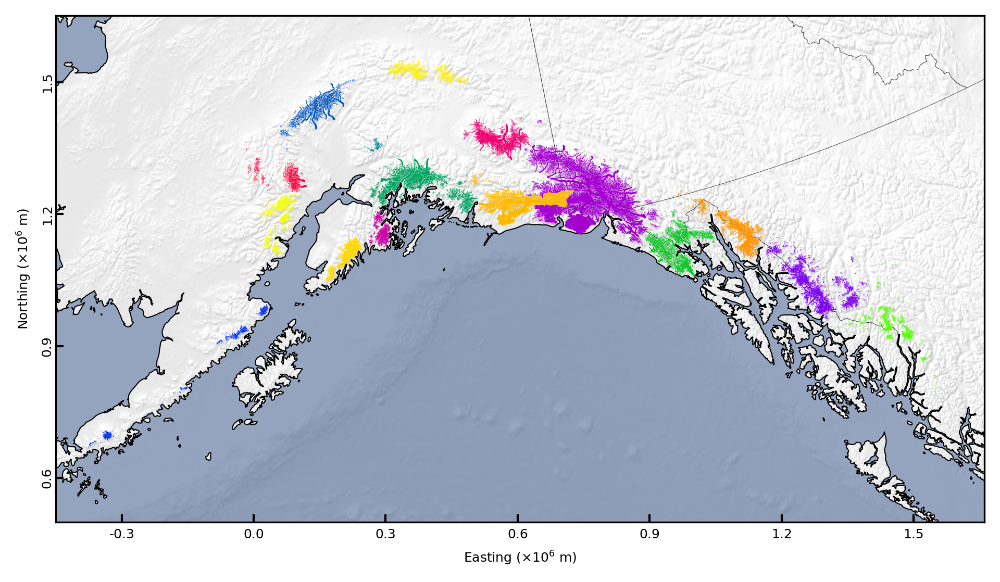

In [16]:
### O3 Regions
fig,axs = snowFun.create_base_map(hillshade=1)
all_data_gdf.plot(ax=axs, column='O3Region', cmap='prism', vmin=0, vmax=16, zorder=10, legend=False,
                  legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'O3Region'})

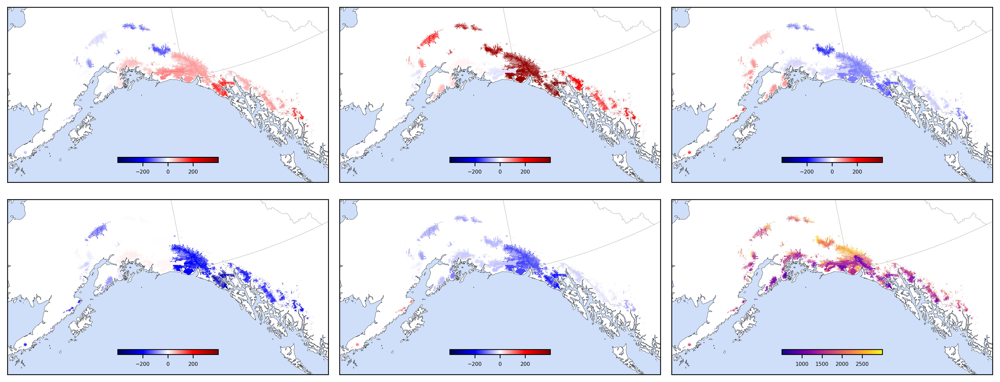

In [17]:
### annual ELA anomaly, binned by o3 region
fig,axs = snowFun.create_annual_base_maps(hillshade=0, width=13.5, height=6.5)
ax18,ax19,ax20,ax21,ax22,axav = [a for ax in axs for a in ax] # flatten out everything
all_axs = [ax18,ax19,ax20,ax21,ax22,axav]
vmin=-399
vmax=399
cmap='RdBu_r'
cmap='seismic'

p18 = o3_df.plot(ax=ax18, column='ela_anom_2018', zorder=10, cmap=cmap, vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.1})

p19 = o3_df.plot(ax=ax19, column='ela_anom_2019', zorder=10, cmap=cmap, vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.1})

p20 = o3_df.plot(ax=ax20, column='ela_anom_2020', zorder=10, cmap='seismic', vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.1})

p21 = o3_df.plot(ax=ax21, column='ela_anom_2021', zorder=10, cmap=cmap, vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.1})

p22 = o3_df.plot(ax=ax22, column='ela_anom_2022', zorder=10, cmap=cmap, vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.1})

pav = all_data_gdf.plot(ax=axav, column='ela_avg_product', zorder=10, cmap='plasma', vmin=501, vmax=2999, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.1})

# format colorbar in each axes
for ax in fig.axes[-6:]:
    ax.tick_params(labelsize=5)
for ax in all_axs:
    ax.set_title("")
    
# plt.figtext(0.5,0.9, "Median Annual ELA - Large Glaciers", ha='center', size=8)
plt.tight_layout()

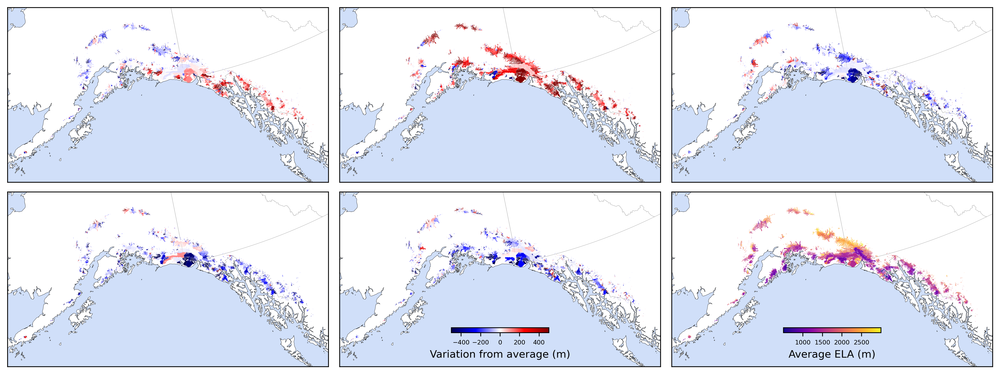

In [72]:
### annual ELA anomaly, binned by o3 region
fig,axs = snowFun.create_annual_base_maps(hillshade=0, width=13.5, height=6.5)
ax18,ax19,ax20,ax21,ax22,axav = [a for ax in axs for a in ax] # flatten out everything
all_axs = [ax18,ax19,ax20,ax21,ax22,axav]
vmin=-500
vmax=500
cmap='RdBu_r'
cmap='seismic'

p18 = all_data_gdf.plot(ax=ax18, column='ela_2018_relative', zorder=10, cmap=cmap, vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.16})

p19 = all_data_gdf.plot(ax=ax19, column='ela_2019_relative', zorder=10, cmap=cmap, vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.16})

p20 = all_data_gdf.plot(ax=ax20, column='ela_2020_relative', zorder=10, cmap='seismic', vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.16})

p21 = all_data_gdf.plot(ax=ax21, column='ela_2021_relative', zorder=10, cmap=cmap, vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.16})

p22 = all_data_gdf.plot(ax=ax22, column='ela_2022_relative', zorder=10, cmap=cmap, vmin=vmin, vmax=vmax, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.16, "label":'Variation from average (m)'})

pav = all_data_gdf.plot(ax=axav, column='ela_avg_product', zorder=10, cmap='plasma', vmin=501, vmax=2999, legend=True,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.16, "label":'Average ELA (m)'})

# format colorbar in each axes
for ax in fig.axes[-6:]:
    ax.tick_params(labelsize=6)
for ax in all_axs:
    ax.set_title("")
    
# lets actually remove the colorbar in some axes
for ax in fig.axes[-6:-2]:
    ax.remove()
    
# plt.figtext(0.5,0.9, "Median Annual ELA - Large Glaciers", ha='center', size=8)
plt.tight_layout()

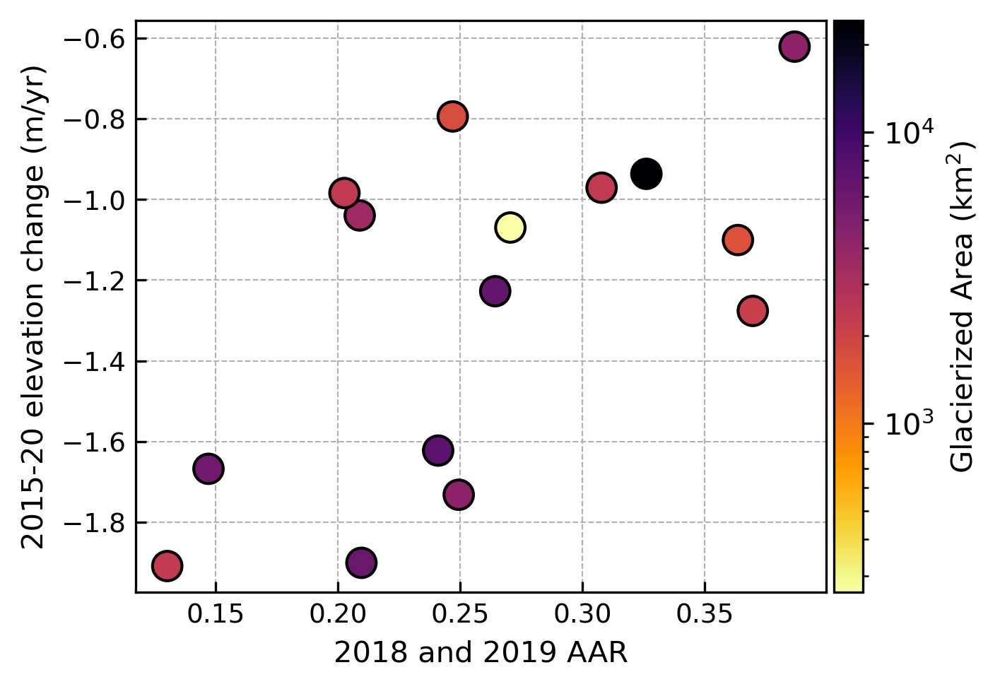

In [20]:
# plot o3region AAR vs dhdt
fig,axs = plt.subplots(figsize=(5,3.5), dpi=300)

sc = axs.scatter((o3_df['aar_2018']+o3_df['aar_2019'])/2, o3_df['dhdt_1520'], zorder=10,
                    s=100,
                    c=o3_df['area'],
                    edgecolor='black',
                    cmap='inferno_r',
                    norm=LogNorm())

# set tick and label stuff
axs.set_xlabel("2018 and 2019 AAR", fontsize = 10)
axs.set_ylabel("2015-20 elevation change (m/yr)", fontsize = 10)
axs.tick_params(axis='both', direction='in', labelsize=9)

# add grid
axs.grid(zorder=1, linestyle='dashed', linewidth=0.5)

# format legend for the sizing https://matplotlib.org/stable/gallery/lines_bars_and_markers/scatter_with_legend.html
# handles, labels = sc.legend_elements(prop="sizes",
#                                      alpha=0.9, num=3, color=sc.cmap(0.4),
#                                      func=lambda s: (s/4)**2  )

# legend2 = axs.legend(handles, labels, title="Glacier Area",
#                      labelspacing=1.5, borderpad=1.2, edgecolor='black', fontsize=8,
#                      loc='upper left', bbox_to_anchor=(0.65, 0.53), fancybox=True, shadow=True)

# put colorbar for continuous color scale
plt.colorbar(sc, label='Glacierized Area (km$^2$)', pad=0.01)

Text(0.5, 1.0, 'Slope: 85,   R2: 0.281')

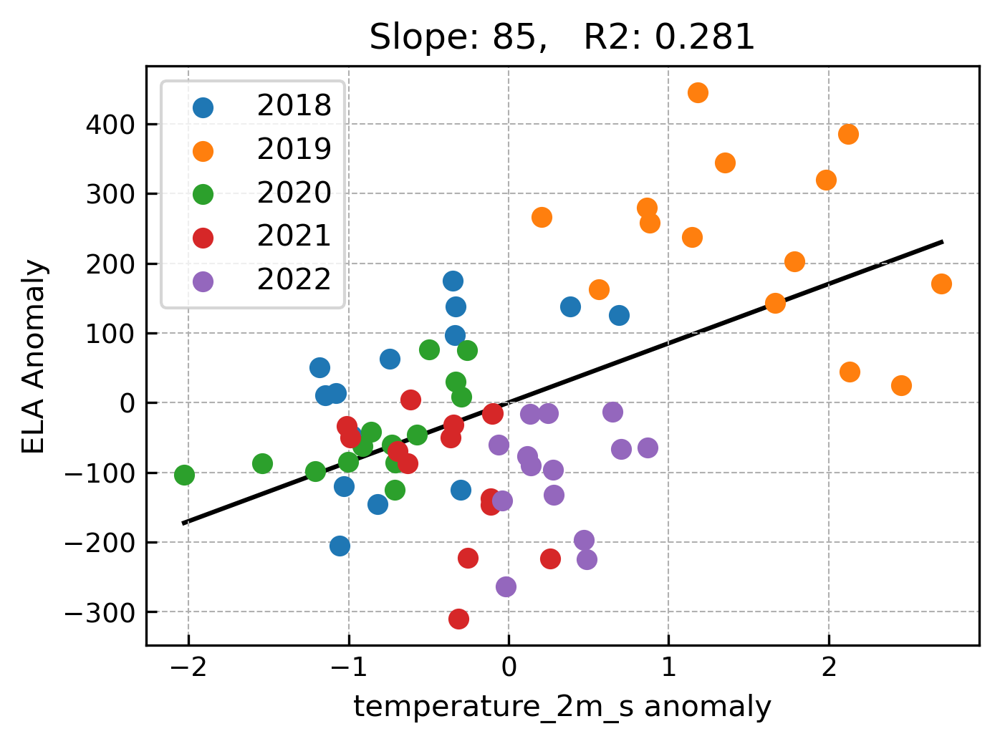

In [147]:
# plot o3region climate anomalies vs ELA anomaly
fig,axs = plt.subplots(figsize=(5,3.5), dpi=300)

years = [2018,2019,2020,2021,2022]
target_climate = "temperature_2m_s"  #"temperature_2m_s", "temperature_2m_w", "total_precipitation_sum_s", "total_precipitation_sum_w", "snowfall_sum_s", "snowfall_sum_w"
target_response = "ela_5km_anom" #ela_5km_anom ela_5km_mean

# subset to specific regions if you want
df_to_use = o3_df #o3_df[o3_df['O3Region'].isin([8,9,10,11,12,13,14,15,16])]

allx = []
ally = []
for year in years: #ela_5km_anom_2020
    xs = df_to_use[f'{target_climate}_anom_{year}']
    ys = df_to_use[f'{target_response}_{year}']
    sc = axs.scatter(xs, ys, label=year, zorder=5)
    
    allx = allx + list(xs.values)
    ally = ally + list(ys.values)

# add colorbar
axs.legend()

# set tick and label stuff
axs.set_xlabel(f"{target_climate} anomaly", fontsize = 10)
axs.set_ylabel("ELA Anomaly", fontsize = 10)
axs.tick_params(axis='both', direction='in', labelsize=9)

# add grid
axs.grid(zorder=1, linestyle='dashed', linewidth=0.5)

# calculate and print linear regression results
from sklearn import linear_model

# make into df quickly
df_reg = pd.DataFrame({target_climate:allx, target_response:ally })

X = df_reg[[target_climate]]
y = df_reg[target_response]

regr = linear_model.LinearRegression(fit_intercept=True) # no intercept fit because we want it to pass through 0,0
regr.fit(X, y)

slope = regr.coef_[0]
r2 = regr.score(X,y)

# add line to plot
axs.plot( [np.nanmin(X), np.nanmax(X)], [np.nanmin(X)*slope, np.nanmax(X)*slope],
         zorder=1, c='black')

axs.set_title(f"Slope: {round(slope)},   R2: {round(r2,3)}")

Slope: [-417.75524921   73.12878435],   R2: 0.668


Text(0.5, 1.0, 'Slope: [-417.75524921   73.12878435],   R2: 0.668')

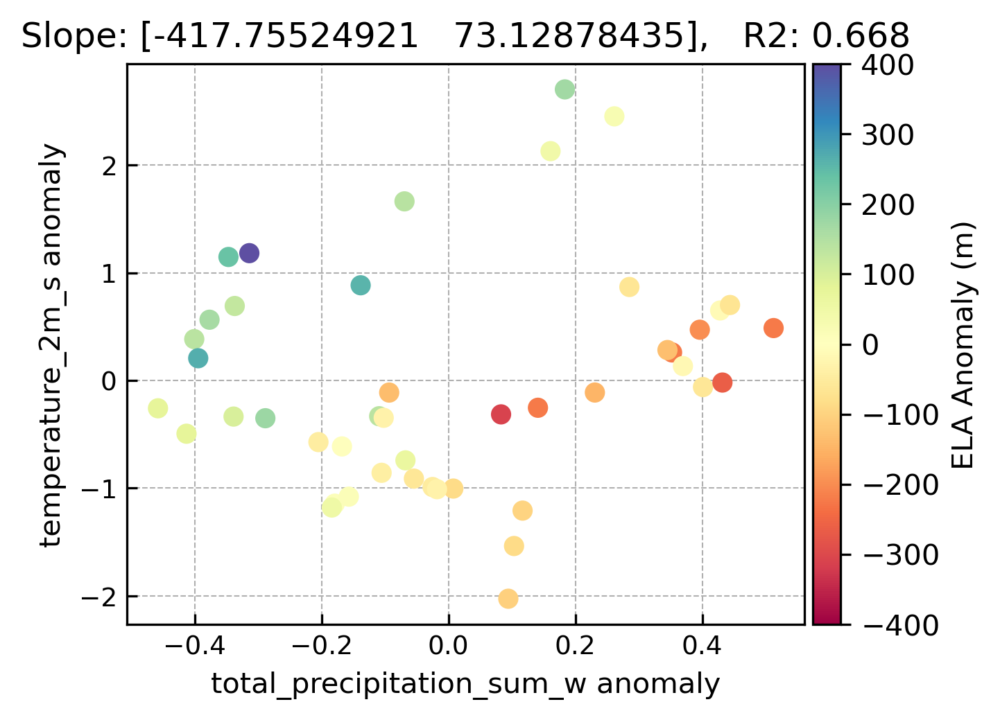

In [148]:
# plot o3region climate anomalies vs ELA anomaly
fig,axs = plt.subplots(figsize=(5,3.5), dpi=300)

#"temperature_2m_s", "temperature_2m_w", "total_precipitation_sum_s", "total_precipitation_sum_w", "snowfall_sum_s", "snowfall_sum_w"
target_climate_x = "total_precipitation_sum_w"  
target_climate_y = "temperature_2m_s"
target_response = "ela_5km_anom" #ela_5km_anom ela_5km_mean

# subset to specific regions if you want
df_to_use = o3_df[o3_df['O3Region'].isin([8,9,10,11,12,13,14,15,16])]

allx1 = []
allx2 = []
ally = []

years = [2018,2019,2020,2021,2022]
for year in years: #ela_5km_anom_2020
    xs = df_to_use[f'{target_climate_x}_anom_{year}']
    ys = df_to_use[f'{target_climate_y}_anom_{year}']
    colors = df_to_use[f'{target_response}_{year}']
    sc = axs.scatter(xs, ys, c=colors, 
                     vmin=-400, vmax=400, cmap="Spectral", zorder=5)
    
    allx1 = allx1 + list(xs.values)
    allx2 = allx2 + list(ys.values)
    ally = ally + list(colors.values)

# set tick and label stuff
axs.set_xlabel(f"{target_climate_x} anomaly", fontsize = 10)
axs.set_ylabel(f"{target_climate_y} anomaly", fontsize = 10)
axs.tick_params(axis='both', direction='in', labelsize=9)

# add grid
axs.grid(zorder=1, linestyle='dashed', linewidth=0.5)

# add colorbar
plt.colorbar(sc, label='ELA Anomaly (m)', pad=0.01)    



# calculate and print linear regression results
from sklearn import linear_model

# make into df quickly
df_reg = pd.DataFrame({target_climate_x:allx1, target_climate_y:allx2, target_response:ally })

X = df_reg[[target_climate_x, target_climate_y]]
y = df_reg[target_response]

regr = linear_model.LinearRegression(fit_intercept=True) # no intercept fit because we want it to pass through 0,0
regr.fit(X, y)

slope = regr.coef_
r2 = regr.score(X,y)

print(f"Slope: {slope},   R2: {round(r2,3)}")
# add line to plot
# axs.plot( [np.nanmin(X), np.nanmax(X)], [np.nanmin(X)*slope, np.nanmax(X)*slope],
#          zorder=1, c='black')

axs.set_title(f"Slope: {slope},   R2: {round(r2,3)}")

# for example: from model CESM2, scenario ssp245 - if wolverine increases winter precip by 17% and summer temp by 3 K:
# 0.17*-417 + 106*3 = 247 m rise

# for example: from model CESM2, scenario ssp585 - if wolverine increases winter precip by 54% and summer temp by 6 K:
# 0.54*-417 + 73*6 = 212 m rise


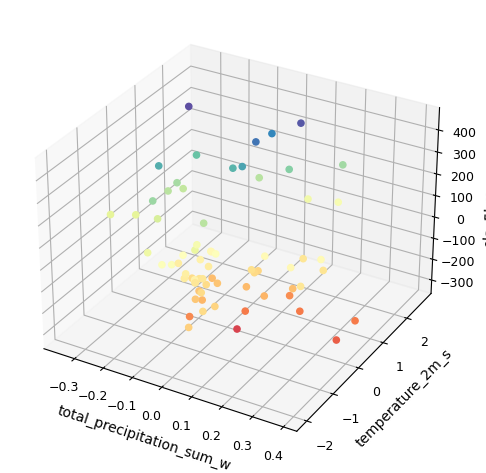

In [126]:
# 3d plotting

fig = plt.figure()
axs = fig.add_subplot(projection='3d')

#"temperature_2m_s", "temperature_2m_w", "total_precipitation_sum_s", "total_precipitation_sum_w", "snowfall_sum_s", "snowfall_sum_w"
target_climate_x = "total_precipitation_sum_w"  
target_climate_y = "temperature_2m_s"
target_response = "ela_5km_anom" #ela_5km_anom ela_5km_mean

axs.set_xlabel(target_climate_x)
axs.set_ylabel(target_climate_y)
axs.set_zlabel(target_response)
axs.tick_params(axis='both', direction='in', labelsize=9)

allx1 = []
allx2 = []
ally = []

years = [2018,2019,2020,2021,2022]
for year in years: #ela_5km_anom_2020
    xs = o3_df[f'{target_climate_x}_anom_{year}']
    ys = o3_df[f'{target_climate_y}_anom_{year}']
    colors = o3_df[f'{target_response}_{year}']
    sc = axs.scatter(xs, ys, colors, c=colors, alpha=1,
                     vmin=-400, vmax=400, cmap="Spectral", zorder=5)
    
    allx1 = allx1 + list(xs.values)
    allx2 = allx2 + list(ys.values)
    ally = ally + list(colors.values)

plt.tight_layout()

<Axes: xlabel='Easting ($ \\times 10^6$ m)', ylabel='Northing ($ \\times 10^6$ m)'>

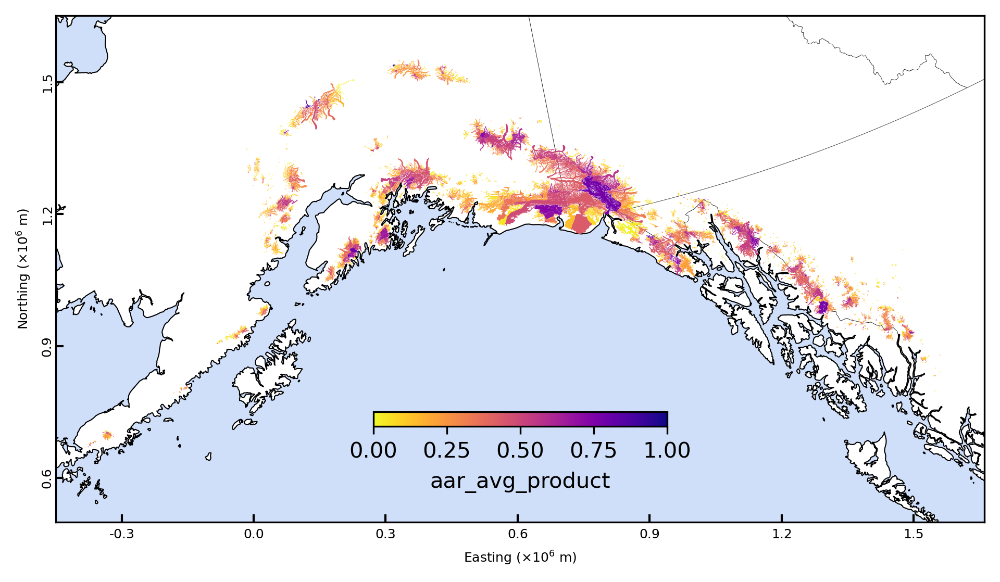

In [19]:
fig,axs = snowFun.create_base_map(hillshade=0)
all_data_gdf.plot(ax=axs, column='aar_avg_product', zorder=10, cmap='plasma_r', legend=True, vmin=0, vmax=1,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'aar_avg_product'})

[]

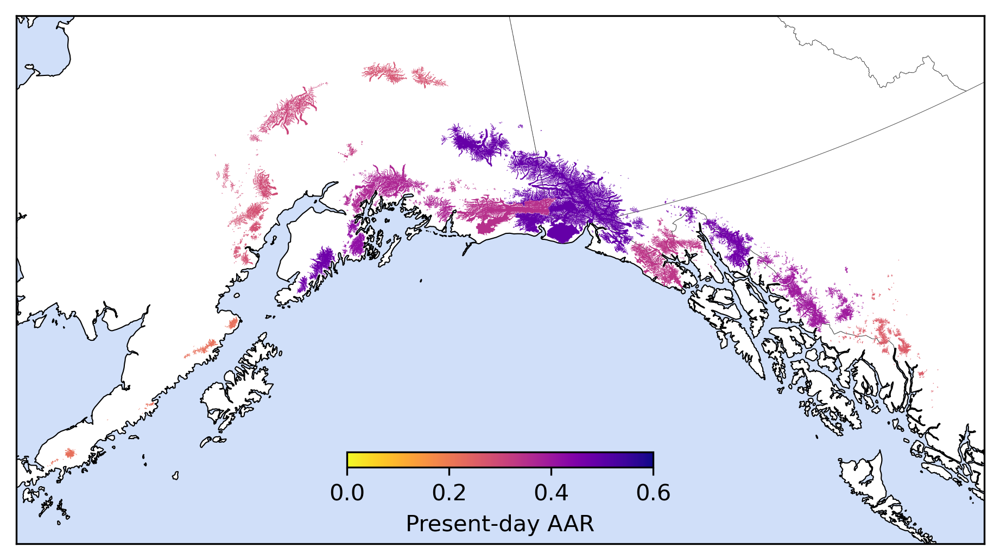

In [20]:
fig,axs = snowFun.create_base_map(hillshade=0)
o3_df.plot(ax=axs, column='hyps_aar', zorder=10, cmap='plasma_r', legend=True, vmin=0, vmax=0.6,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.12, "label":'Present-day AAR'})
axs.set_xlabel("")
axs.set_ylabel("")
axs.set_xticks([])
axs.set_yticks([])

<Axes: xlabel='Easting ($ \\times 10^6$ m)', ylabel='Northing ($ \\times 10^6$ m)'>

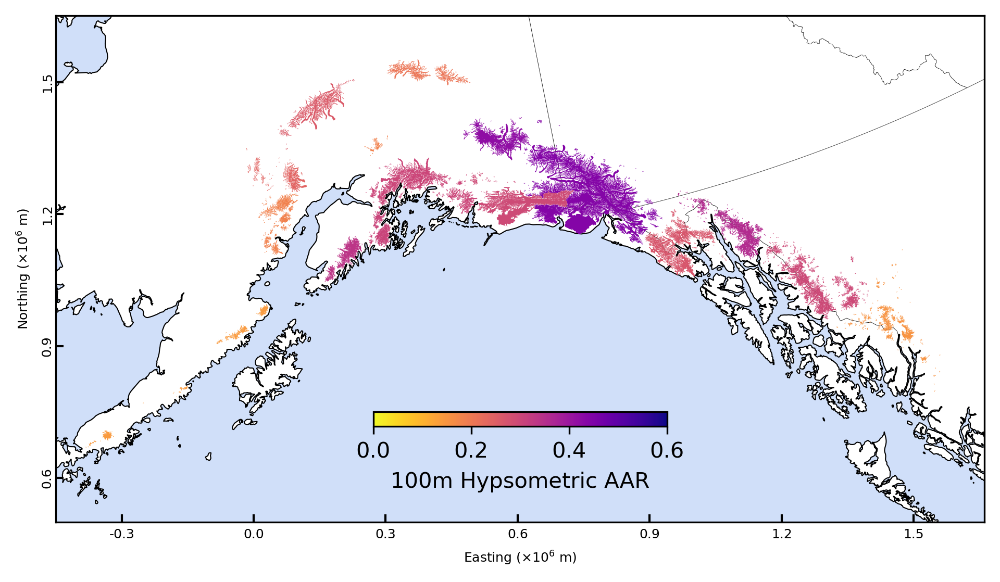

In [21]:
fig,axs = snowFun.create_base_map(hillshade=0)
o3_df.plot(ax=axs, column='hyps_100_aar', zorder=10, cmap='plasma_r', legend=True, vmin=0, vmax=0.6,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'100m Hypsometric AAR'})

<Axes: xlabel='Easting ($ \\times 10^6$ m)', ylabel='Northing ($ \\times 10^6$ m)'>

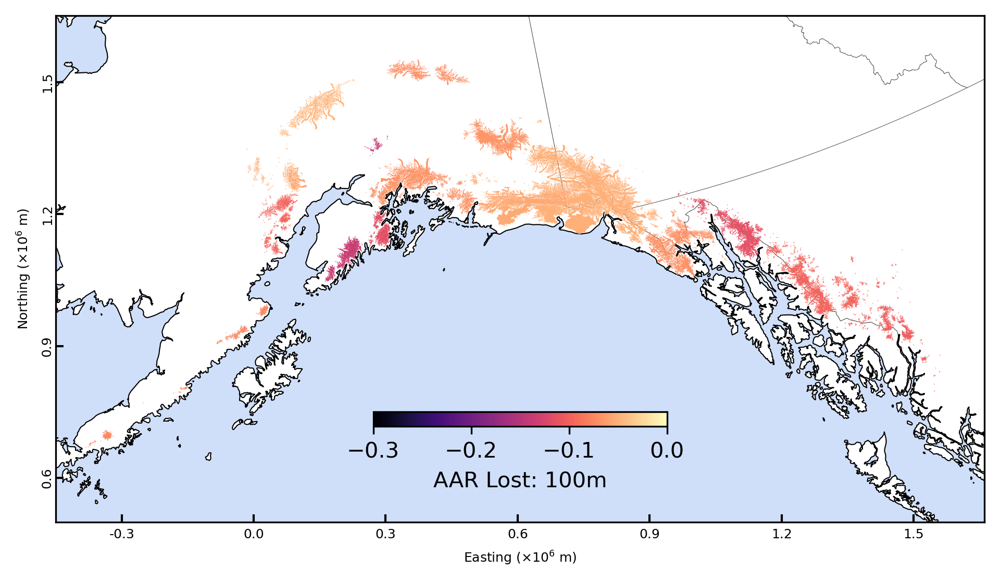

In [22]:
o3_df['temp'] = o3_df['hyps_100_aar']-o3_df['hyps_aar']
fig,axs = snowFun.create_base_map(hillshade=0)
o3_df.plot(ax=axs, column='temp', zorder=10, cmap='magma', legend=True, vmin=-0.3, vmax=0,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'AAR Lost: 100m'})

<Axes: xlabel='Easting ($ \\times 10^6$ m)', ylabel='Northing ($ \\times 10^6$ m)'>

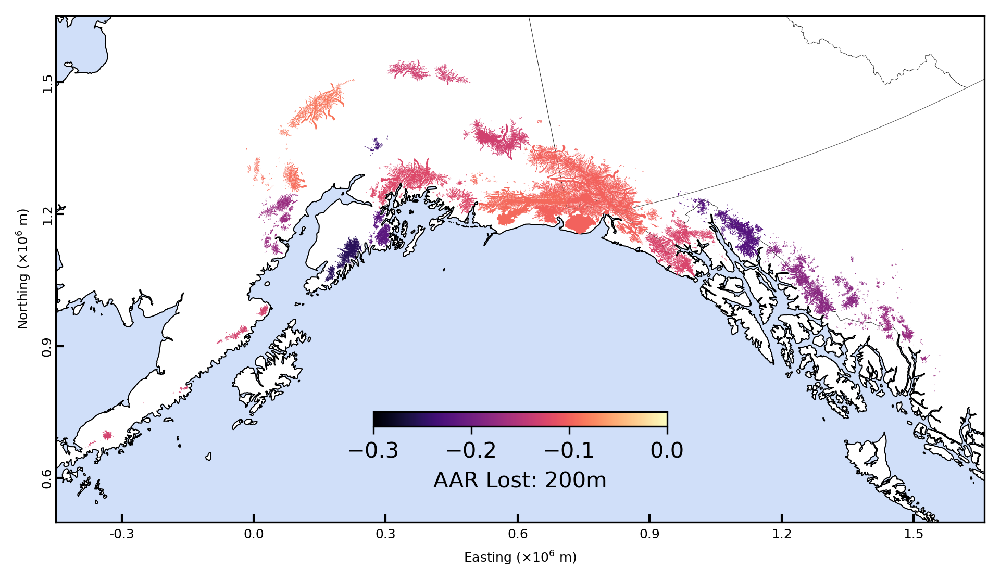

In [23]:
o3_df['temp'] = o3_df['hyps_200_aar']-o3_df['hyps_aar']
fig,axs = snowFun.create_base_map(hillshade=0)
o3_df.plot(ax=axs, column='temp', zorder=10, cmap='magma', legend=True, vmin=-0.3, vmax=0,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'AAR Lost: 200m'})

[]

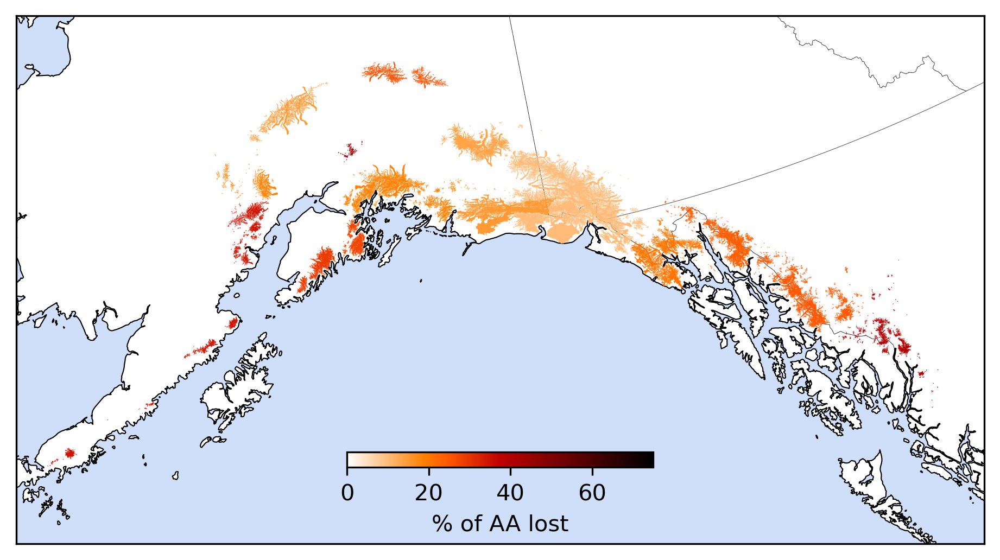

In [24]:
o3_df['temp'] = (1-o3_df['hyps_100_aar']/o3_df['hyps_aar'])*100

# create cmap
cmap = mpl.colormaps['YlOrRd']
cmap = ListedColormap(cmap(np.linspace(0.1, 1, 256)))
cmap='gist_heat_r'

fig,axs = snowFun.create_base_map(hillshade=0)   #magma_r YlOrRd
o3_df.plot(ax=axs, column='temp', zorder=10, cmap=cmap, legend=True, vmin=0, vmax=75,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.12, "label":'% of AA lost'})
axs.set_xlabel("")
axs.set_ylabel("")
axs.set_xticks([])
axs.set_yticks([])

[]

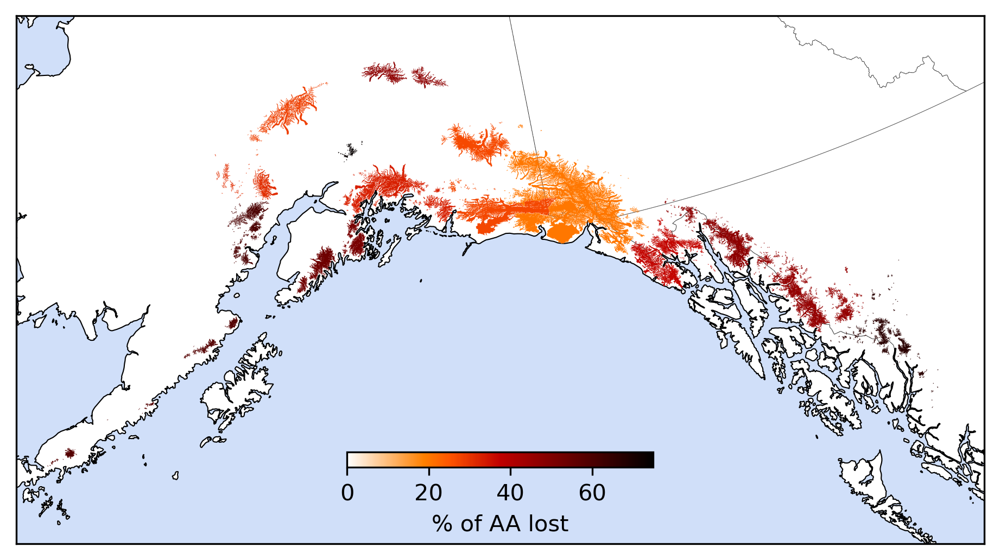

In [25]:
o3_df['temp'] = (1-o3_df['hyps_200_aar']/o3_df['hyps_aar'])*100
cmap='gist_heat_r'

fig,axs = snowFun.create_base_map(hillshade=0)   #magma_r YlOrRd
o3_df.plot(ax=axs, column='temp', zorder=10, cmap=cmap, legend=True, vmin=0, vmax=75,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.12, "label":'% of AA lost'})
axs.set_xlabel("")
axs.set_ylabel("")
axs.set_xticks([])
axs.set_yticks([])

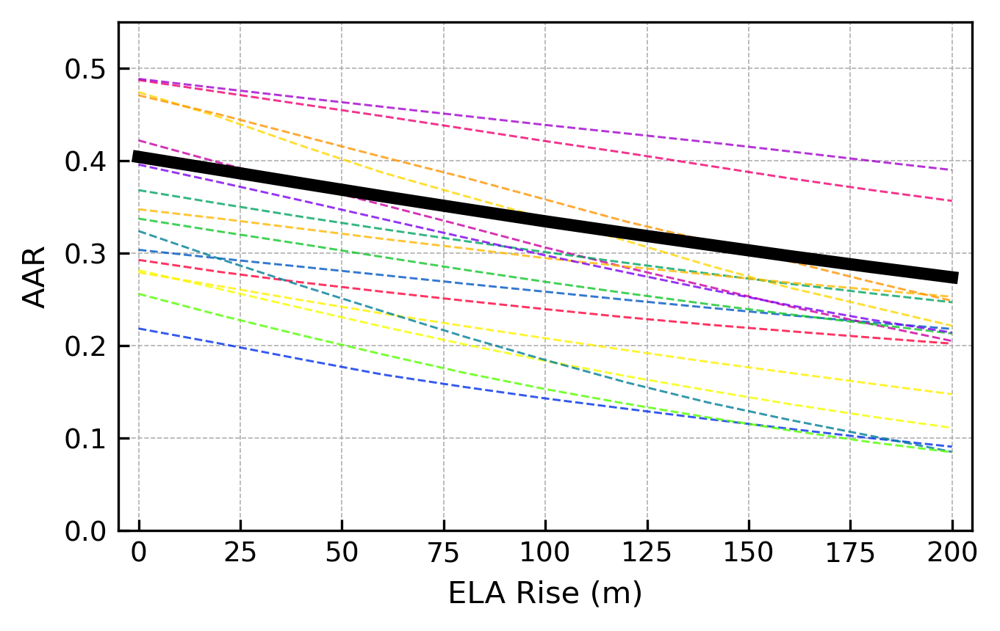

In [89]:
### make a plot of how the regional-aar will change with rising elas
fig,axs = plt.subplots(figsize=(5,3), dpi=300)

cmap = 'prism'
cmap = mpl.colormaps['prism']
cmap = ListedColormap(cmap(np.linspace(0, 1, 17)))

# make separate plot for each subregion
for idx,row in o3_df.iterrows():
#     print(idx)
    xs = np.arange(0,201,20)
    ys = [row[f'hyps_{x}_aar'] for x in xs]
    c=cmap(idx)
    
    axs.plot(xs,ys, c=c, linestyle='dashed', alpha=0.8, linewidth=0.7)

# lastly, plot the entire region's AAR change
ys = []
for x in xs:
    ys.append( np.nansum(all_data_gdf[f"hyps_{x}_aa"])/np.nansum(all_data_gdf["Area"]) )
axs.plot(xs,ys,c='black', linewidth=4)


axs.set_xlim(-5,205)
axs.set_ylim(0,0.55)
axs.set_xlabel("ELA Rise (m)")
axs.set_ylabel("AAR")

axs.tick_params(axis='both', direction='in', labelsize=9)

# add grid
axs.grid(zorder=1, linestyle='dashed', linewidth=0.4)

#     o3_df[f'hyps_{i}_aa'] = all_data_gdf.groupby('O3Region')[f'hyps_{i}_aa'].sum()
# o3_df[f'hyps_{i}_aar'] = o3_df[f'hyps_{i}_aa']/o3_df['area']

[]

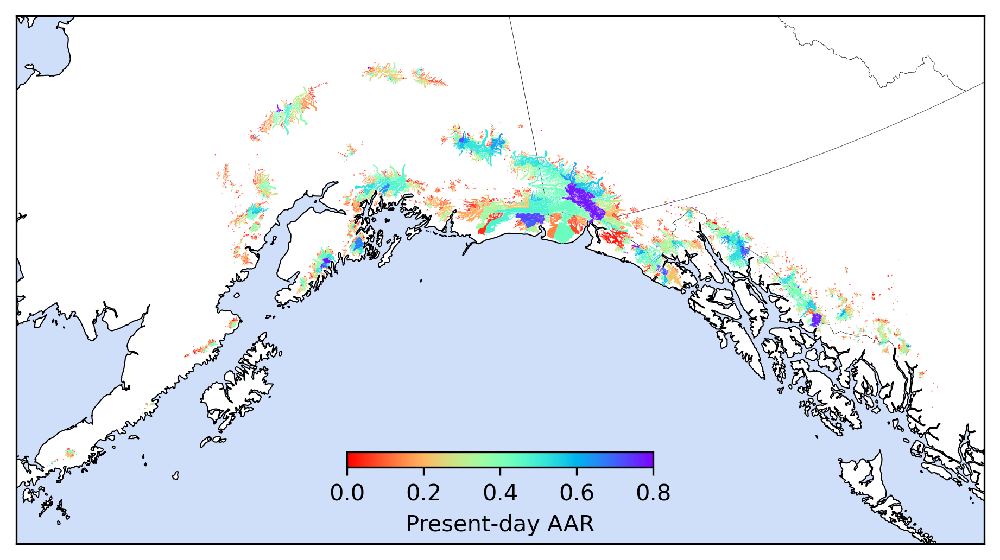

In [57]:
# hyps_aar or aar_avg_product?  plasma or Spectral? rainbow
fig,axs = snowFun.create_base_map(hillshade=0)
all_data_gdf.plot(ax=axs, column='aar_avg_product', zorder=10, cmap='rainbow_r', legend=True, vmin=0, vmax=0.8, #0.6
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.12, "label":'Present-day AAR'})

axs.set_xlabel("")
axs.set_ylabel("")
axs.set_xticks([])
axs.set_yticks([])

<Axes: xlabel='Easting ($ \\times 10^6$ m)', ylabel='Northing ($ \\times 10^6$ m)'>

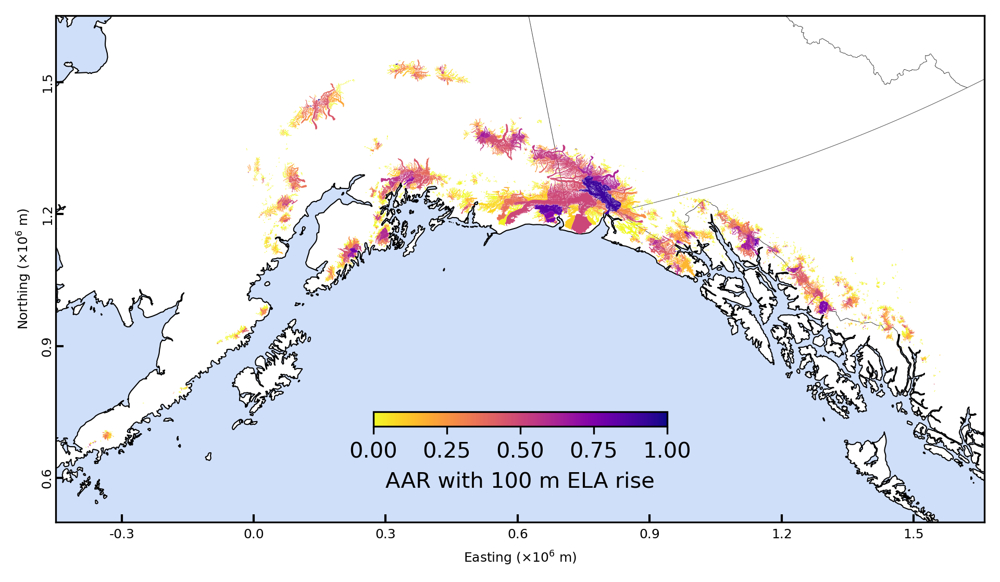

In [28]:
fig,axs = snowFun.create_base_map(hillshade=0)
all_data_gdf.plot(ax=axs, column='hyps_aar_100', zorder=10, cmap='plasma_r', legend=True, vmin=0, vmax=1,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'AAR with 100 m ELA rise'})

<Axes: xlabel='Easting ($ \\times 10^6$ m)', ylabel='Northing ($ \\times 10^6$ m)'>

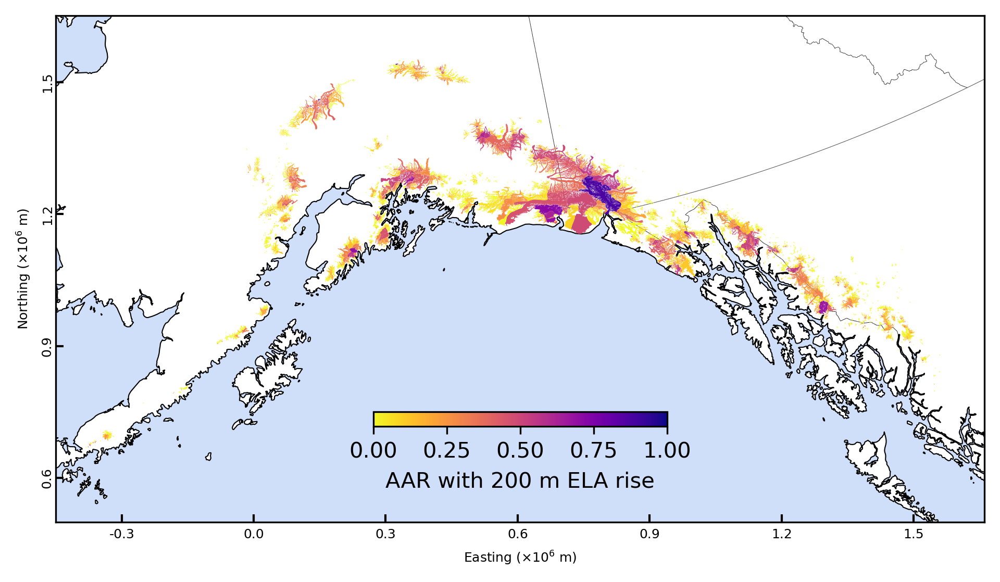

In [29]:
fig,axs = snowFun.create_base_map(hillshade=0)
all_data_gdf.plot(ax=axs, column='hyps_aar_200', zorder=10, cmap='plasma_r', legend=True, vmin=0, vmax=1,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'AAR with 200 m ELA rise'})

[]

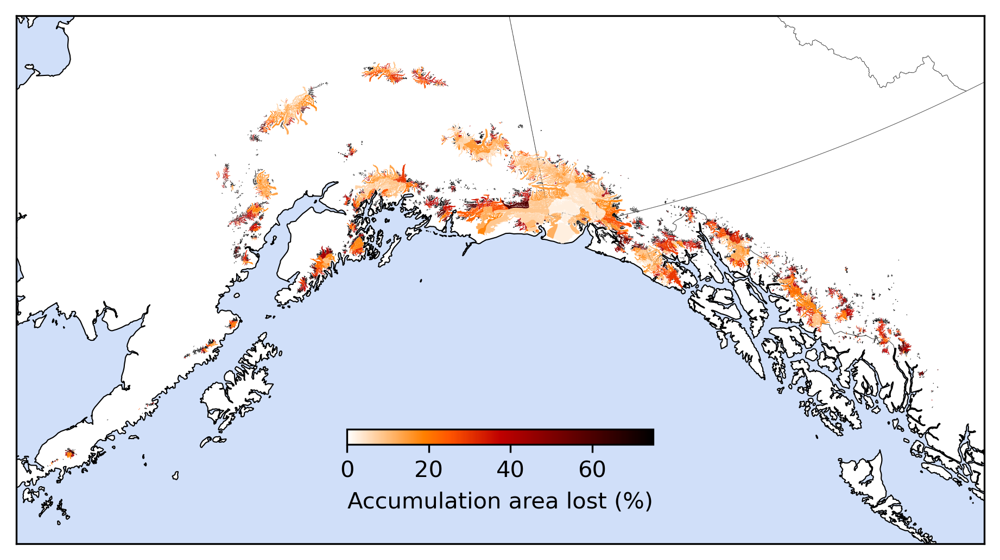

In [62]:
all_data_gdf['temp'] = (1-all_data_gdf['hyps_aar_100']/all_data_gdf['hyps_aar'])*100
cmap='gist_heat_r'

fig,axs = snowFun.create_base_map(hillshade=0)
all_data_gdf.plot(ax=axs, column='temp', zorder=10, cmap=cmap, legend=True, vmin=0, vmax=75,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'Accumulation area lost (%)'})

axs.set_xlabel("")
axs.set_ylabel("")
axs.set_xticks([])
axs.set_yticks([])

[]

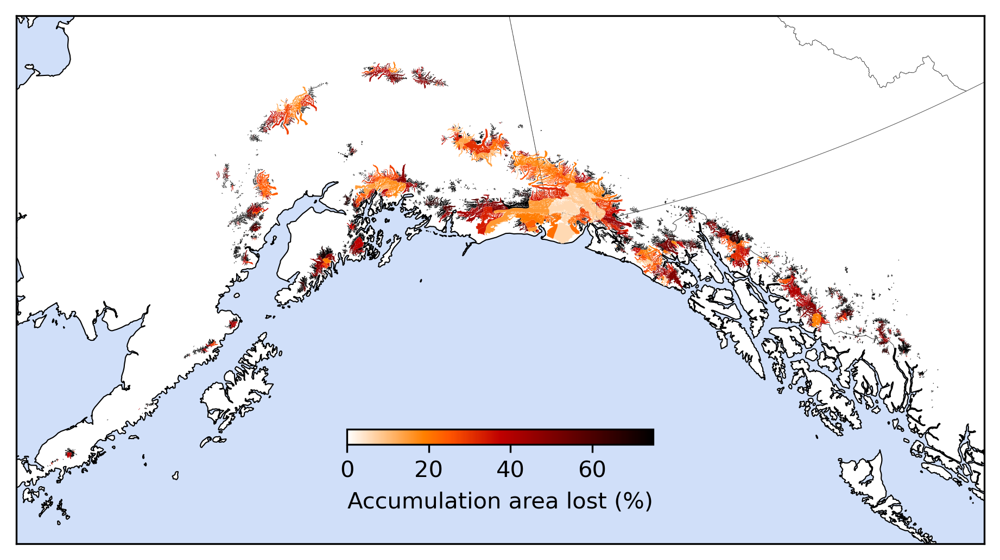

In [61]:
all_data_gdf['temp'] = (1-all_data_gdf['hyps_aar_200']/all_data_gdf['hyps_aar'])*100
cmap='gist_heat_r'

fig,axs = snowFun.create_base_map(hillshade=0)
all_data_gdf.plot(ax=axs, column='temp', zorder=10, cmap=cmap, legend=True, vmin=0, vmax=75,
                          legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'Accumulation area lost (%)'})

axs.set_xlabel("")
axs.set_ylabel("")
axs.set_xticks([])
axs.set_yticks([])

[]

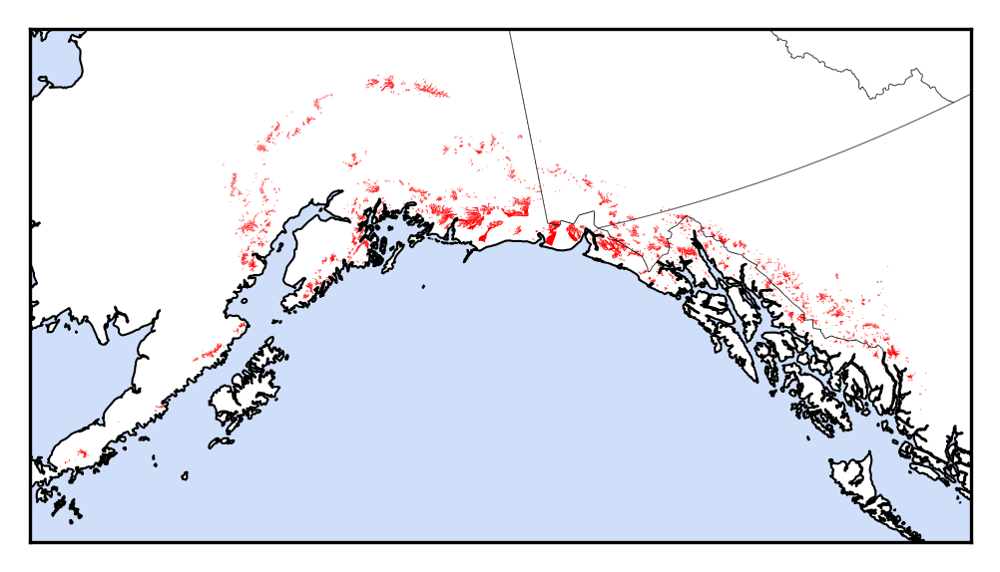

In [88]:
all_data_gdf['temp'] = (1-all_data_gdf['hyps_aar_200']/all_data_gdf['hyps_aar'])*100
cmap='gist_heat_r'

subset = all_data_gdf[all_data_gdf["hyps_200_no_aar"]==1]
# subset = gpd.GeoDataFrame(geometry=gpd.points_from_xy(subset['CenLon'], subset['CenLat']), crs="EPSG:4326").to_crs("EPSG:3338")

fig,axs = snowFun.create_base_map(width=3.7, height=2.3, hillshade=0)
# all_data_gdf.plot(ax=axs, column='temp', zorder=10, cmap=cmap, legend=True, vmin=0, vmax=75,
#                           legend_kwds={"location":'bottom', "fraction":0.02, 'pad':-0.15, "label":'Accumulation area lost (%)'})

subset.plot(ax=axs, color='red')

axs.set_xlabel("")
axs.set_ylabel("")
axs.set_xticks([])
axs.set_yticks([])

<Axes: >

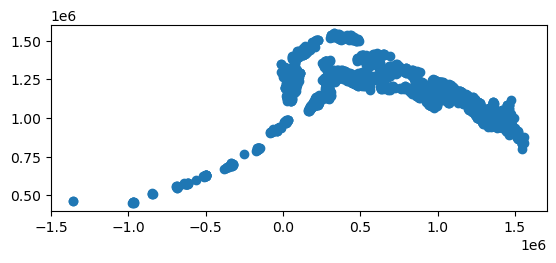

In [81]:

fig,axs = plt.subplots()
subset.plot(ax=axs)

In [ ]:
# get stats for what type of glaciers have multiple years of EITHER no arr (<10%) or ela above the glacier elevation
df_deadglaciers = pd.DataFrame()
df_deadglaciers['count'] = all_data_gdf.groupby(['no_aar_or_no_ela'])['Area'].count()
df_deadglaciers['mean_area'] = all_data_gdf.groupby(['no_aar_or_no_ela'])['Area'].mean()
df_deadglaciers['median_area'] = all_data_gdf.groupby(['no_aar_or_no_ela'])['Area'].median()
df_deadglaciers['max_area'] = all_data_gdf.groupby(['no_aar_or_no_ela'])['Area'].max()

df_deadglaciers.head(6)


In [ ]:
# get stats for what type of glaciers have multiple years of no arr (<10%)
df_deadglaciers = pd.DataFrame()
df_deadglaciers['count'] = all_data_gdf.groupby(['no_aar_total'])['Area'].count()
df_deadglaciers['mean_area'] = all_data_gdf.groupby(['no_aar_total'])['Area'].mean()
df_deadglaciers['median_area'] = all_data_gdf.groupby(['no_aar_total'])['Area'].median()
df_deadglaciers['max_area'] = all_data_gdf.groupby(['no_aar_total'])['Area'].max()

df_deadglaciers.head(6)

In [ ]:
# get stats for what type of glaciers have multiple years of no ela above glacier elevation range
df_deadglaciers = pd.DataFrame()
df_deadglaciers['count'] = all_data_gdf.groupby(['off_glacier_total'])['Area'].count()
df_deadglaciers['mean_area'] = all_data_gdf.groupby(['off_glacier_total'])['Area'].mean().round(4)
df_deadglaciers['median_area'] = all_data_gdf.groupby(['off_glacier_total'])['Area'].median()
df_deadglaciers['max_area'] = all_data_gdf.groupby(['off_glacier_total'])['Area'].max()
df_deadglaciers['mean_aar'] = all_data_gdf.groupby(['off_glacier_total'])['aar_median'].mean().round(4)

df_deadglaciers.head(6)